# Stoneburner, Kurt
- ## DSC 650 - Assignment 12


Importing Pillow images into Numpy
https://www.pluralsight.com/guides/importing-image-data-into-numpy-arrays

Pillow Resize Images: https://pythonexamples.org/python-pillow-resize-image/

Celeb A Dataset: http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html

In [1]:
import os
import sys
# //*** Imports and Load Data
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from pathlib import Path
import time

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

#//*** Use the whole window in the IPYNB editor
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

#//*** Clear the output display, helpful for content that updates
from IPython.display import clear_output


#//*** Maximize columns and rows displayed by pandas
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', None)

import PIL
from PIL import Image
#//*** Get Working Directory
current_dir = Path(os.getcwd()).absolute()

#//*** Build Image Directory
base_image_dir = current_dir.parents[2].joinpath("img_align_celeba")

resize_dir = base_image_dir.joinpath("resize_128")

Tensorflow Datasets: https://www.tensorflow.org/datasets/overview

In [2]:
attribs = {
    'size' : (128,128),
    'keras_dims' : (128,128,3),

    'sample_size' : 1000,
    'test_split' : .1,
    'file_prefix': "128x128_1000_Shuffle_progressive",
}


def sample_images(sample_size=1000,shuffled=True, display_image=True):

    x_train = []

    #//*** Get a list of image files
    filelist = np.array(os.listdir(base_image_dir))
    
    if shuffled:
        #//*** Shuffle the list of image files
        np.random.shuffle(filelist)


    counter = 1
    print("Loading Samples...")
    for filename in filelist[:sample_size]:
        #clear_output(wait=True)


        #print("Resizing: ", counter,"/",attribs['sample_size'])

        #//*** File does not exist. Open original and resize

        #//*** Open Pillow Image Object
        image = Image.open(base_image_dir.joinpath(filename))

        #//*** Resize Image
        image = image.resize(attribs['size'])

        #//*** Save Image
       # image.save(resize_dir.joinpath(filename))

        #//*** Add image to training set
        x_train.append( np.asarray(image) )


        counter += 1

    if display_image:
        #//*** Display a sample image
        plt.imshow(Image.fromarray(x_train[0])   )
        plt.show()

    #//*** Index to split for test train
    split_index = len(x_train) - int(len(x_train)*attribs['test_split'])

    x_test = x_train[split_index:]

    x_train = x_train[:split_index]
    
    return x_train,x_test



**Variational Autoencoder network**

In [3]:
latent_dim = 3

encoder_inputs = keras.Input(shape=(attribs['keras_dims']))
x = layers.Conv2D(32, 3, activation="relu", strides=2, padding="same")(encoder_inputs)
x = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Flatten()(x)
x = layers.Dense(16, activation="relu")(x)
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
encoder = keras.Model(encoder_inputs, [z_mean, z_log_var], name="encoder")

encoder.summary()

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 64, 64, 32)   896         ['input_1[0][0]']                
                                                                                                  
 conv2d_1 (Conv2D)              (None, 32, 32, 64)   18496       ['conv2d[0][0]']                 
                                                                                                  
 flatten (Flatten)              (None, 65536)        0           ['conv2d_1[0][0]']         

**Latent-Sapce-Sampling Layer**

In [4]:
class Sampler(layers.Layer):
    def call(self, z_mean, z_log_var):
        batch_size = tf.shape(z_mean)[0]
        z_size = tf.shape(z_mean)[1]
        epsilon = tf.random.normal(shape=(batch_size, z_size))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon



**Variational decoder network, mapping latent space points to images**

In [5]:
latent_inputs = keras.Input(shape=(latent_dim,))
x = layers.Dense(32 * 32 * 64, activation="relu")(latent_inputs)
x = layers.Reshape((32, 32, 64))(x)
x = layers.Conv2DTranspose(64, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
decoder_outputs = layers.Conv2D(3, 3, activation="sigmoid", padding="same")(x)
decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")

decoder.summary()

Model: "decoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 3)]               0         
                                                                 
 dense_1 (Dense)             (None, 65536)             262144    
                                                                 
 reshape (Reshape)           (None, 32, 32, 64)        0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 64, 64, 64)       36928     
 nspose)                                                         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 128, 128, 32)     18464     
 ranspose)                                                       
                                                                 
 conv2d_2 (Conv2D)           (None, 128, 128, 3)       867 

**Variational Autoencoder with custom train_step()**

In [6]:
class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super().__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.sampler = Sampler()
        self.total_loss_tracker = keras.metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = keras.metrics.Mean(
            name="reconstruction_loss")
        self.kl_loss_tracker = keras.metrics.Mean(name="kl_loss")

    @property
    def metrics(self):
        return [self.total_loss_tracker,
                self.reconstruction_loss_tracker,
                self.kl_loss_tracker]

    def train_step(self, data):
        with tf.GradientTape() as tape:
            z_mean, z_log_var = self.encoder(data)
            z = self.sampler(z_mean, z_log_var)
            reconstruction = decoder(z)
            reconstruction_loss = tf.reduce_mean(
                tf.reduce_sum(
                    keras.losses.binary_crossentropy(data, reconstruction),
                    axis=(1, 2)
                )
            )
            kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
            total_loss = reconstruction_loss + tf.reduce_mean(kl_loss)
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        return {
            "total_loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }

**Training the Variational Auto Encoder**

Loading Samples...
8/8 [==============================] - 13s 2s/step - total_loss: 11331.1348 - reconstruction_loss: 11328.3984 - kl_loss: 2.6425
Epochs: 1 1
Ding_1.jpg


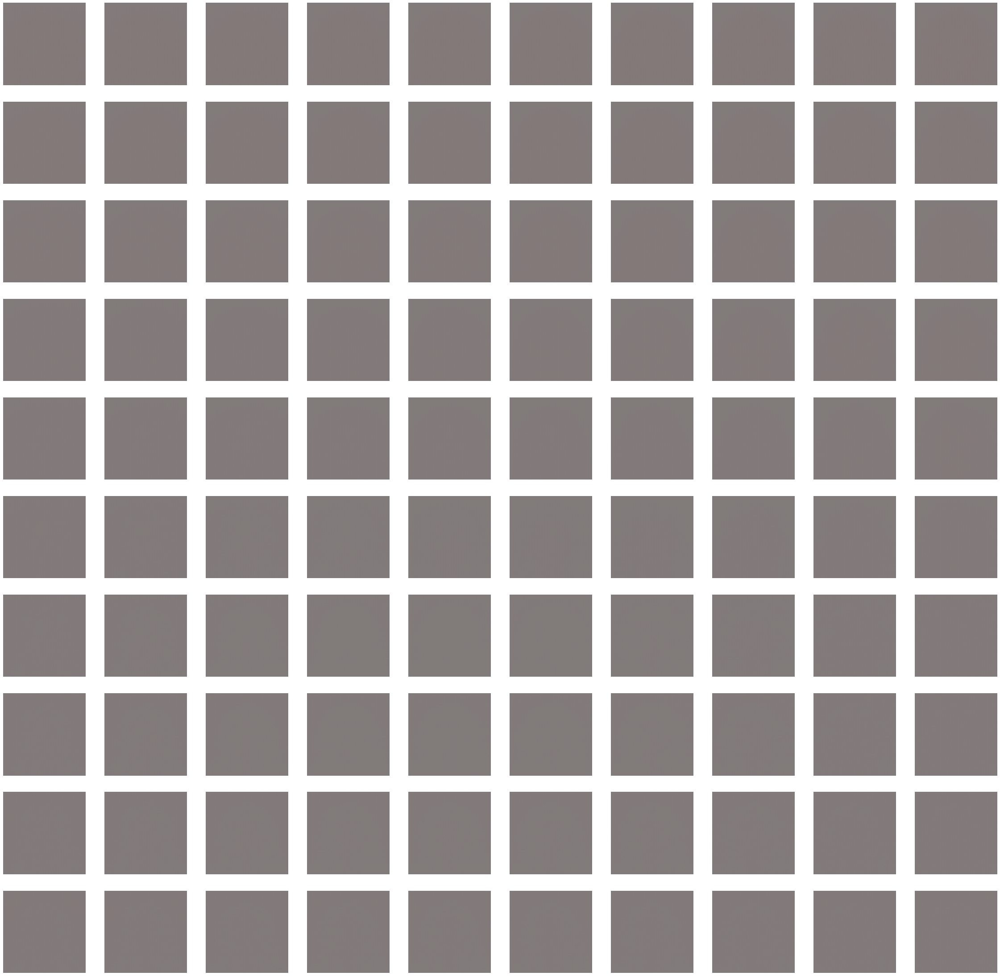

Loading Samples...
8/8 [==============================] - 14s 2s/step - total_loss: 11158.3701 - reconstruction_loss: 11152.0205 - kl_loss: 6.3886
Loading Samples...
8/8 [==============================] - 14s 2s/step - total_loss: 10939.6045 - reconstruction_loss: 10932.8809 - kl_loss: 6.5503
Loading Samples...
8/8 [==============================] - 14s 2s/step - total_loss: 11160.7783 - reconstruction_loss: 11044.9951 - kl_loss: 118.4785
Loading Samples...
8/8 [==============================] - 14s 2s/step - total_loss: 10782.2910 - reconstruction_loss: 10775.9697 - kl_loss: 6.1666
Epochs: 5 5
Ding_5.jpg


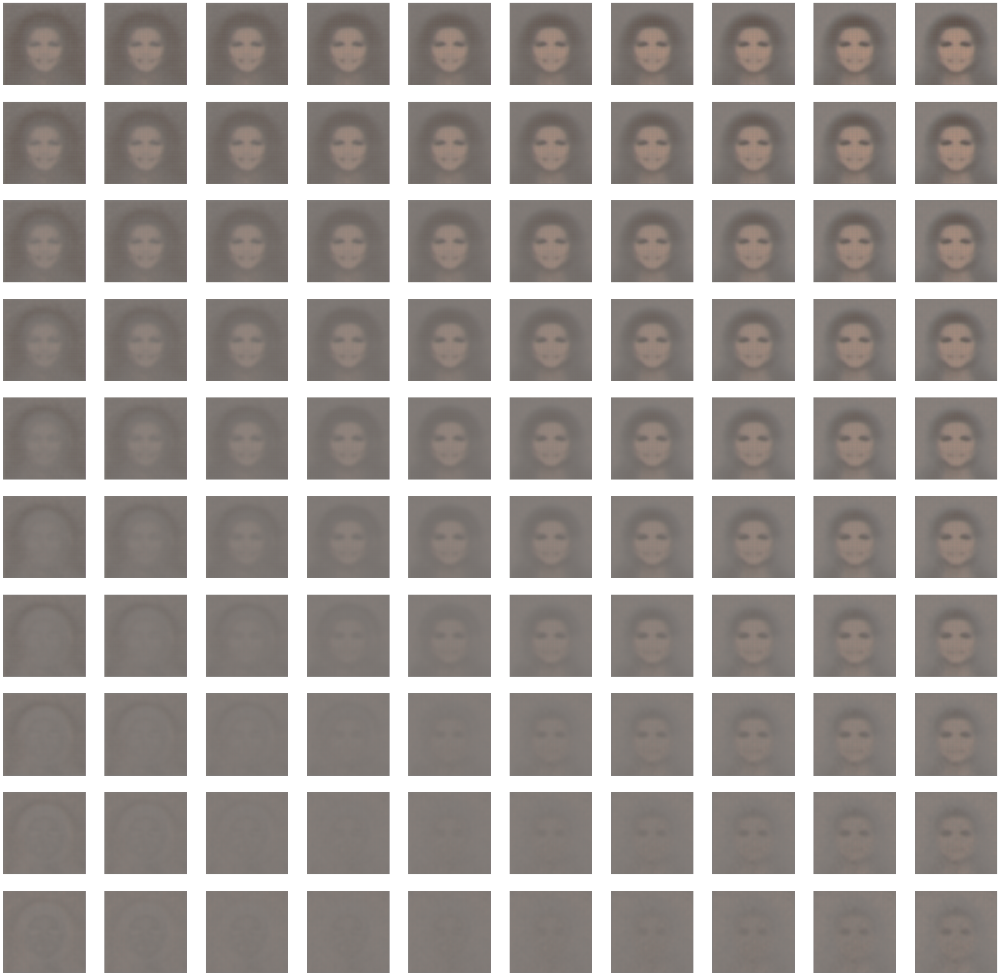

Loading Samples...
8/8 [==============================] - 14s 2s/step - total_loss: 10535.6934 - reconstruction_loss: 10525.1123 - kl_loss: 10.6192
Loading Samples...
8/8 [==============================] - 14s 2s/step - total_loss: 10622.4746 - reconstruction_loss: 10610.4844 - kl_loss: 12.1873
Loading Samples...
8/8 [==============================] - 14s 2s/step - total_loss: 10448.3379 - reconstruction_loss: 10436.3359 - kl_loss: 12.1434
Loading Samples...
8/8 [==============================] - 14s 2s/step - total_loss: 10149.5703 - reconstruction_loss: 10135.3672 - kl_loss: 14.1276
Loading Samples...
8/8 [==============================] - 14s 2s/step - total_loss: 10444.6104 - reconstruction_loss: 10431.5088 - kl_loss: 13.2320
Epochs: 10 10
Ding_10.jpg


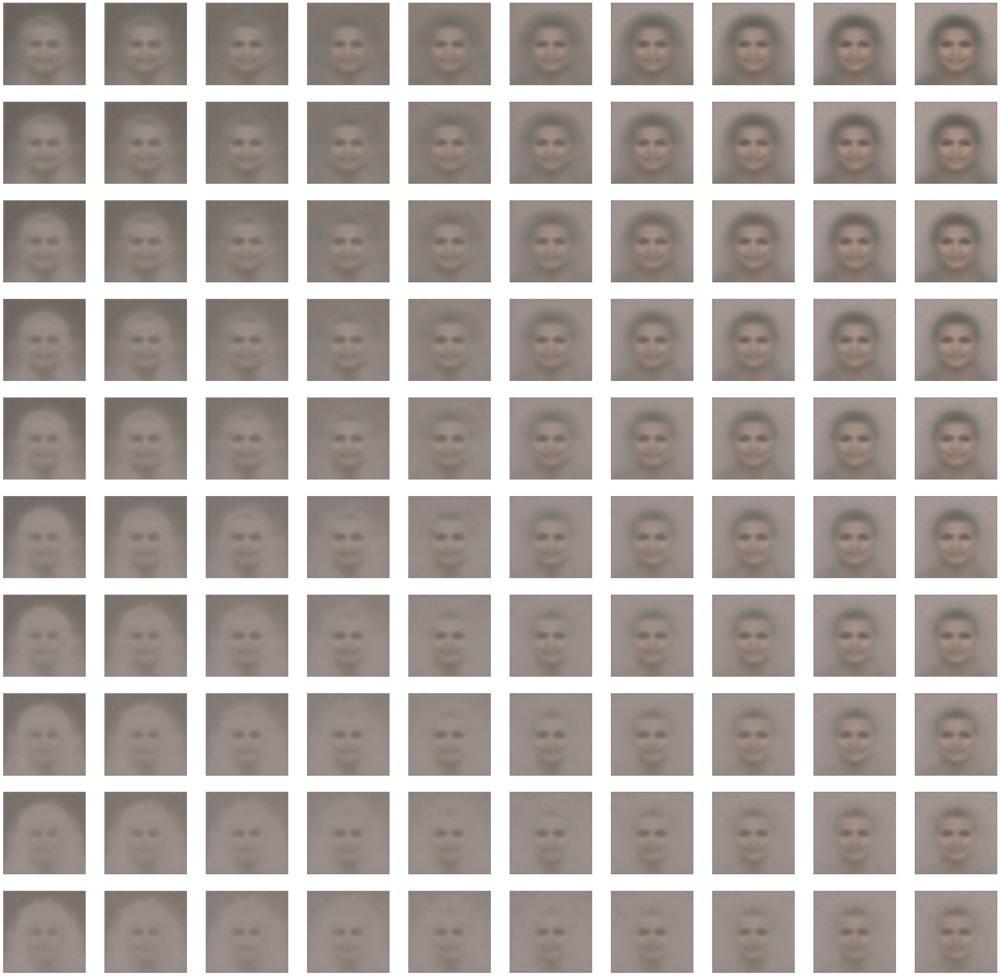

Loading Samples...
8/8 [==============================] - 14s 2s/step - total_loss: 10186.4473 - reconstruction_loss: 10174.2695 - kl_loss: 12.2421
Loading Samples...
8/8 [==============================] - 14s 2s/step - total_loss: 10019.8008 - reconstruction_loss: 10006.1484 - kl_loss: 13.7122
Loading Samples...
8/8 [==============================] - 14s 2s/step - total_loss: 10094.5342 - reconstruction_loss: 10083.9639 - kl_loss: 10.6139
Loading Samples...
8/8 [==============================] - 14s 2s/step - total_loss: 10049.2070 - reconstruction_loss: 10039.5068 - kl_loss: 9.6995
Loading Samples...
8/8 [==============================] - 14s 2s/step - total_loss: 9897.1602 - reconstruction_loss: 9885.4619 - kl_loss: 11.7932
Epochs: 15 15
Ding_15.jpg


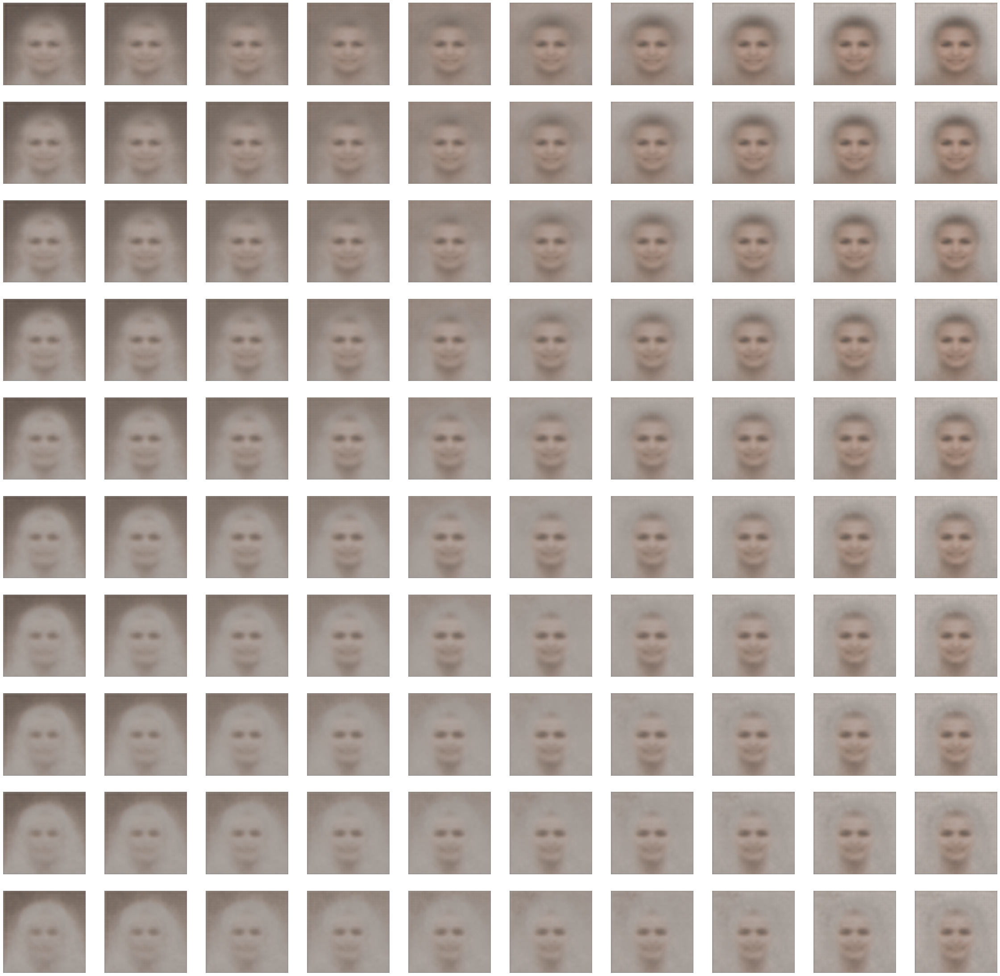

Loading Samples...
8/8 [==============================] - 14s 2s/step - total_loss: 10008.5391 - reconstruction_loss: 9998.7910 - kl_loss: 9.7837
Loading Samples...
8/8 [==============================] - 14s 2s/step - total_loss: 9993.9912 - reconstruction_loss: 9984.8438 - kl_loss: 9.1686
Loading Samples...
8/8 [==============================] - 14s 2s/step - total_loss: 9919.8311 - reconstruction_loss: 9910.4727 - kl_loss: 9.3687
Loading Samples...
8/8 [==============================] - 14s 2s/step - total_loss: 9935.2695 - reconstruction_loss: 9926.0273 - kl_loss: 9.2684
Loading Samples...
8/8 [==============================] - 14s 2s/step - total_loss: 9873.6309 - reconstruction_loss: 9864.1416 - kl_loss: 9.4701
Epochs: 20 20
Ding_20.jpg


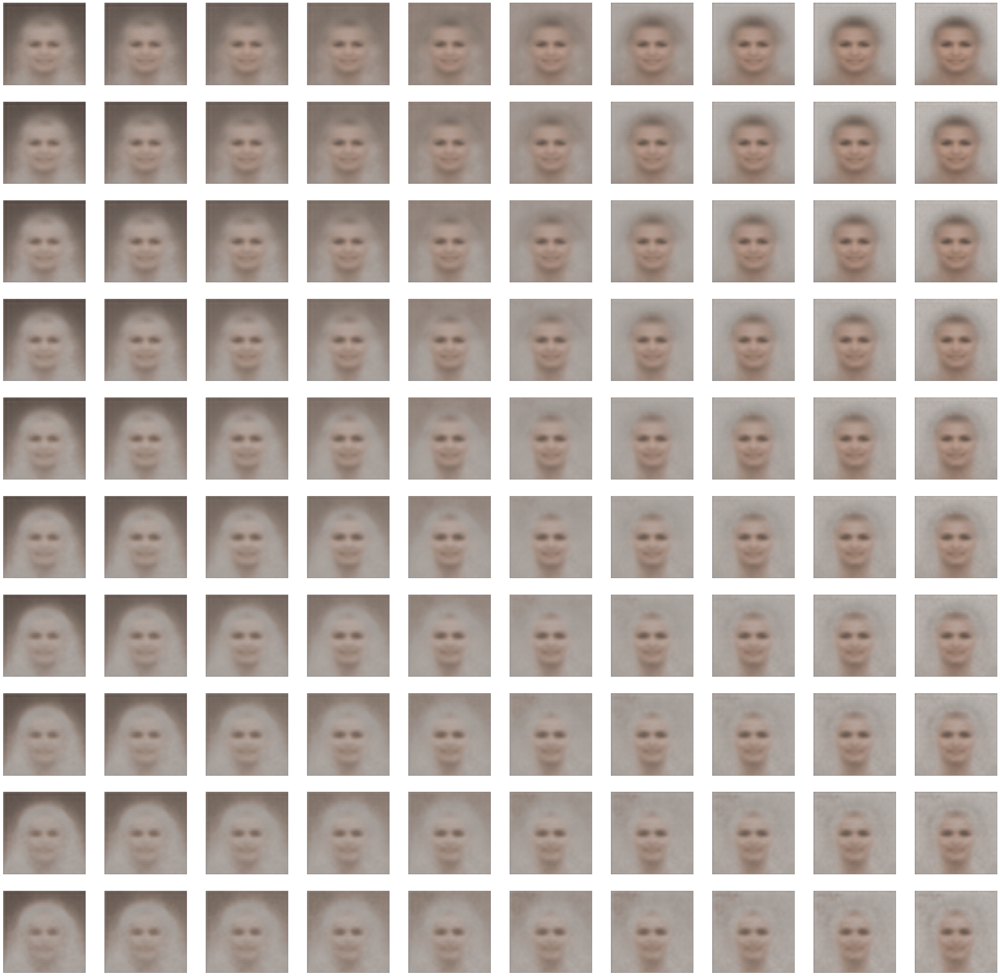

In [7]:


ii = 0
   

import matplotlib.pyplot as plt
import io
from PIL import Image

gif_images = []


for epoch in range(20):

    x_train, x_test = sample_images(attribs['sample_size'],shuffled=True,display_image=False)

    mnist_digits = np.concatenate([x_train, x_test], axis=0).astype("float32") / 255
    #mnist_digits = np.expand_dims(mnist_digits, -1).astype("float32") / 255


    vae = VAE(encoder, decoder)
    vae.compile(optimizer=keras.optimizers.Adam(), run_eagerly=True)
    vae.fit(mnist_digits, epochs=1, verbose=1, batch_size=128)

    ii += 1
    
    if epoch  == 0 or (epoch+1)%5 == 0:
        print("==============")
        print("Epochs:",epoch+1, ii)
        print("==============")


        n = 10
        digit_size = 128
        figure = np.zeros((digit_size * n, digit_size * n))

        grid_x = np.linspace(-1, 1, n)
        grid_y = np.linspace(-1, 1, n)[::-1]

        
        plt.figure(figsize=(40,40))
        
        count=1
        for i, yi in enumerate(grid_y):
            for j, xi in enumerate(grid_x):
                z_sample = np.array([[xi, yi,yi]])
                x_decoded = vae.decoder.predict(z_sample)[0]
                raw_img = (x_decoded*255).astype(np.uint8)
                plt.subplot(n,n,count)
                plt.imshow(Image.fromarray(raw_img)   )
                plt.axis("off")


                count+=1
        
      
        #img_buf = io.BytesIO()
        #gif_images.append(plt.savefig(img_buf, format='jpg'))
        print(f"Ding_{ii}.jpg")
        plt.savefig(f"{ attribs['file_prefix']}_{ii}.jpg")
        gif_images.append(f"{ attribs['file_prefix']}_{ii}.jpg")
        plt.show()

    
    
ims = []

for x in gif_images:
    ims.append(Image.open(x))
    
ims[0].save(f"{attribs['file_prefix']}.gif", save_all=True, append_images=ims[1:], duration=750, loop=2)

**Sampling a grid of images from the 2D latent space**

In [8]:
gif_images

['128x128_1000_Shuffle_progressive_1.jpg',
 '128x128_1000_Shuffle_progressive_5.jpg',
 '128x128_1000_Shuffle_progressive_10.jpg',
 '128x128_1000_Shuffle_progressive_15.jpg',
 '128x128_1000_Shuffle_progressive_20.jpg']

In [9]:
#ims[0].save(f"{attribs['file_prefix']}.gif", save_all=True, append_images=ims[1:], duration=750, loop=2)

In [10]:
# //*** CODE HERE